In [7]:
import os
import re

import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import umap
from sklearn.preprocessing import StandardScaler

In [8]:
from pollock.models.model import predict_from_anndata, embed_from_anndata

In [4]:
# !pip install loompy

In [5]:
adata = sc.read_loom('/home/estorrs/data/single_cell_classification/hca/census_of_immune_cells/cc95ff89-2e68-4a08-a234-480eca21ce79.homo_sapiens.loom')
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 782859 × 58347
    obs: 'analysis_protocol.protocol_core.protocol_id', 'analysis_protocol.provenance.document_id', 'analysis_working_group_approval_status', 'barcode', 'bundle_uuid', 'bundle_version', 'cell_suspension.genus_species.ontology', 'cell_suspension.genus_species.ontology_label', 'cell_suspension.provenance.document_id', 'derived_organ_label', 'derived_organ_ontology', 'derived_organ_parts_label', 'derived_organ_parts_ontology', 'donor_organism.development_stage.ontology', 'donor_organism.development_stage.ontology_label', 'donor_organism.diseases.ontology', 'donor_organism.diseases.ontology_label', 'donor_organism.human_specific.ethnicity.ontology', 'donor_organism.human_specific.ethnicity.ontology_label', 'donor_organism.is_living', 'donor_organism.provenance.document_id', 'donor_organism.sex', 'dss_bundle_fqid', 'emptydrops_is_cell', 'file_uuid', 'file_version', 'genes_detected', 'library_preparation_protocol.end_bias', 'library_prepara

In [10]:
adata.var_names_make_unique()

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/utils.py:117: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD113-1', 'SNORD113-2', 'SNORD113-3', 'SNORD113-4', 'SNORD113-5']
  + str(example_colliding_values)


## run pollock for initial cell types

In [11]:
module_fp = '/home/estorrs/rds_conversion/data/scRNAseq/immune/immune_module'
preds = predict_from_anndata(adata, module_fp)
preds

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:08:42,328 0 genes in training set are missing from prediction set
2020-12-11 12:08:43,591 starting batch 1 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:08:43,882 0 genes in training set are missing from prediction set
2020-12-11 12:09:19,475 starting batch 2 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_

2020-12-11 12:20:58,304 0 genes in training set are missing from prediction set
2020-12-11 12:21:35,021 starting batch 22 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:21:35,305 0 genes in training set are missing from prediction set
2020-12-11 12:22:12,269 starting batch 23 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:22:12,824 0 genes in training set are missing from prediction set
2020-12-11 12:22:49,182 starting batch 24 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: F

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:34:12,374 0 genes in training set are missing from prediction set
2020-12-11 12:34:47,884 starting batch 44 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:34:48,162 0 genes in training set are missing from prediction set
2020-12-11 12:35:25,783 starting batch 45 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not i

2020-12-11 12:46:54,236 0 genes in training set are missing from prediction set
2020-12-11 12:47:29,452 starting batch 65 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:47:29,720 0 genes in training set are missing from prediction set
2020-12-11 12:48:05,309 starting batch 66 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:48:05,815 0 genes in training set are missing from prediction set
2020-12-11 12:48:43,529 starting batch 67 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: F

,predicted_cell_type,cell_type_probability,probability_CD34+ CLP,probability_CD34+ ERP,probability_CD34+ ERP-Early,probability_CD34+ Eo/B/Mast,probability_CD34+ Gran,probability_CD34+ HSC,probability_CD34+ HSC-cycle,probability_CD34+ LMPP,...,probability_Immature-Neutrophil,probability_Monocyte,probability_NK cells,probability_Naive T-cell,probability_Neutrophil,probability_Plasma Cell,probability_Platelet,probability_Pre-Dendritic,probability_Pro-B,probability_Stromal
cell_id,,,,,,,,,,,,,,,,,,,,,
0000892fbc276097f396352e3f2a4b51,Erythroblast,0.24,0.06,0.11,0.03,0.01,0.03,0.00,0.01,0.00,...,0.01,0.00,0.00,0.00,0.01,0.01,0.01,0.01,0.01,0.00
0000e539a7dfe057f8013c9f5081b369,Follicular B cell,0.29,0.01,0.00,0.00,0.00,0.01,0.03,0.00,0.01,...,0.05,0.01,0.05,0.06,0.00,0.02,0.00,0.03,0.00,0.00
000142a0499aecd716932f5c475e1d51,Neutrophil,0.60,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.27,0.00,0.00,0.00,0.60,0.00,0.00,0.00,0.00,0.00
0002078f929f37ffa735bd59379e35f7,Naive T-cell,0.87,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.87,0.00,0.01,0.00,0.00,0.00,0.00
0002c6543dd6e2ecc2f370e1897770d5,Naive T-cell,0.31,0.04,0.01,0.00,0.01,0.00,0.01,0.01,0.02,...,0.00,0.00,0.07,0.31,0.00,0.00,0.01,0.01,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffd4ff0f06ebdb378e8bf970c262bb5,CD34+ CLP,0.10,0.10,0.06,0.00,0.02,0.02,0.02,0.00,0.05,...,0.04,0.02,0.02,0.01,0.04,0.00,0.00,0.04,0.04,0.02
fffe24f9671bdd2019331f15ad73893e,Immature-Neutrophil,0.13,0.06,0.05,0.01,0.00,0.02,0.00,0.00,0.02,...,0.13,0.03,0.03,0.02,0.09,0.01,0.00,0.03,0.03,0.01
fffe7fb70df2c18839a0247692aa3073,Naive T-cell,0.40,0.02,0.00,0.02,0.00,0.00,0.01,0.00,0.01,...,0.00,0.00,0.07,0.40,0.00,0.00,0.00,0.02,0.00,0.00


In [12]:
embs = embed_from_anndata(adata, module_fp)
embs

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:56:06,236 0 genes in training set are missing from prediction set
2020-12-11 12:56:06,771 starting batch 1 of 79
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-11 12:56:07,233 0 genes in training set are missing from prediction set
2020-12-11 12:56:42,287 starting batch 2 of 79
2020-12-11 12:56:42,592 0 genes in training set are missing from prediction set
2020-12-11 12:57:17,631 starting batch 3 of 79
2020-12-11 12:57:17,928 0 genes in training set are missing from prediction set
2020-12-11 12:57:53,180 s

2020-12-11 13:31:57,939 starting batch 61 of 79
2020-12-11 13:31:58,254 0 genes in training set are missing from prediction set
2020-12-11 13:32:33,400 starting batch 62 of 79
2020-12-11 13:32:33,705 0 genes in training set are missing from prediction set
2020-12-11 13:33:08,806 starting batch 63 of 79
2020-12-11 13:33:09,103 0 genes in training set are missing from prediction set
2020-12-11 13:33:44,247 starting batch 64 of 79
2020-12-11 13:33:44,553 0 genes in training set are missing from prediction set
2020-12-11 13:34:19,598 starting batch 65 of 79
2020-12-11 13:34:19,904 0 genes in training set are missing from prediction set
2020-12-11 13:34:55,141 starting batch 66 of 79
2020-12-11 13:34:55,459 0 genes in training set are missing from prediction set
2020-12-11 13:35:31,004 starting batch 67 of 79
2020-12-11 13:35:31,627 0 genes in training set are missing from prediction set
2020-12-11 13:36:06,971 starting batch 68 of 79
2020-12-11 13:36:07,287 0 genes in training set are miss

,CELL_EMBEDDING_1,CELL_EMBEDDING_2,CELL_EMBEDDING_3,CELL_EMBEDDING_4,CELL_EMBEDDING_5,CELL_EMBEDDING_6,CELL_EMBEDDING_7,CELL_EMBEDDING_8,CELL_EMBEDDING_9,CELL_EMBEDDING_10,...,CELL_EMBEDDING_16,CELL_EMBEDDING_17,CELL_EMBEDDING_18,CELL_EMBEDDING_19,CELL_EMBEDDING_20,CELL_EMBEDDING_21,CELL_EMBEDDING_22,CELL_EMBEDDING_23,CELL_EMBEDDING_24,CELL_EMBEDDING_25
0000892fbc276097f396352e3f2a4b51,-0.099528,0.035597,0.358693,-0.018613,-0.140330,0.039789,-0.149536,-0.003356,0.137302,0.123109,...,0.250668,0.335898,-0.162319,-0.177582,0.230881,-0.049196,-0.191533,0.154837,-0.018940,0.008173
0000e539a7dfe057f8013c9f5081b369,0.073460,0.238429,-0.103067,-0.242191,0.365677,0.246499,0.415654,-0.053417,-0.250862,-0.106464,...,0.080967,-0.288938,-0.111849,0.430111,-0.200068,-0.081495,-0.369668,-0.353035,-0.318951,0.025479
000142a0499aecd716932f5c475e1d51,0.379653,-0.190252,-0.462206,0.558981,0.294727,-0.209425,0.359263,1.460791,-0.140928,0.156244,...,-0.391752,-0.045984,-0.048310,1.343457,0.040429,-0.107174,0.233304,-0.469619,0.296955,0.654086
0002078f929f37ffa735bd59379e35f7,0.051249,0.691969,0.002027,-0.252030,0.657233,0.577060,0.429165,0.226582,-0.249345,-0.178187,...,1.234545,-0.217471,-0.719714,0.953523,-0.915248,0.058501,-1.017410,-0.055157,-0.238511,0.548157
0002c6543dd6e2ecc2f370e1897770d5,1.168826,0.221820,-0.109503,-0.088674,0.408602,0.864585,-0.203430,0.685883,0.046786,-0.635984,...,0.985111,-0.891518,-0.325168,0.377781,-2.207089,0.472269,-0.542680,-0.201100,0.743215,0.034109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffd4ff0f06ebdb378e8bf970c262bb5,-0.158008,0.002801,-0.051511,0.068593,0.077176,0.055571,0.038314,0.117173,0.007235,0.028628,...,-0.051578,-0.046402,-0.028688,0.192584,0.115930,-0.053870,0.097333,-0.008163,-0.080556,0.022099
fffe24f9671bdd2019331f15ad73893e,0.010067,-0.142633,-0.027818,0.046135,0.071411,0.068073,-0.000982,0.236086,-0.086064,0.125938,...,-0.120280,-0.121381,0.133461,0.243409,-0.199136,-0.043546,0.234056,-0.034553,0.187587,0.113441
fffe7fb70df2c18839a0247692aa3073,0.321654,0.259569,0.007468,-0.021203,0.350045,0.465831,0.176719,0.319639,-0.057655,-0.340612,...,0.551785,-0.566277,-0.337314,0.476702,-1.367589,0.172726,-0.422717,0.054217,0.183146,0.385439
fffeedc3ee18b7aec26e93169df100d7,0.529567,-0.025487,-0.224943,0.073346,0.263046,0.352212,-0.126373,0.258379,0.155199,-0.391833,...,0.231332,-0.534614,-0.025154,0.127028,-0.812251,0.196709,-0.111561,-0.147527,0.257359,-0.068188


In [14]:
adata.obs = pd.merge(adata.obs, preds, left_index=True, right_index=True)
adata.obsm['pollock_embedding'] = embs.values
adata.obsm['pollock_umap'] = umap.UMAP().fit_transform(StandardScaler().fit_transform(embs.values))

In [15]:
adata.write_h5ad('/home/estorrs/data/single_cell_classification/hca/census_of_immune_cells/raw_counts.h5ad')

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derive

## process data

In [17]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=5000)
adata.raw = adata

adata = adata[:, adata.var.highly_variable]
# sc.pp.calculate_qc_metrics
# sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata)

sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)
sc.tl.umap(adata)

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [26]:
sc.tl.leiden(adata, resolution=.2)

In [27]:
adata.obs['leiden_course'] = adata.obs['leiden'].to_list()

In [ ]:
sc.tl.leiden(adata, resolution=3.)
adata.obs['leiden_fine'] = adata.obs['leiden'].to_list()

In [22]:
# sc.set_figure_params()

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'leiden_course' as categorical


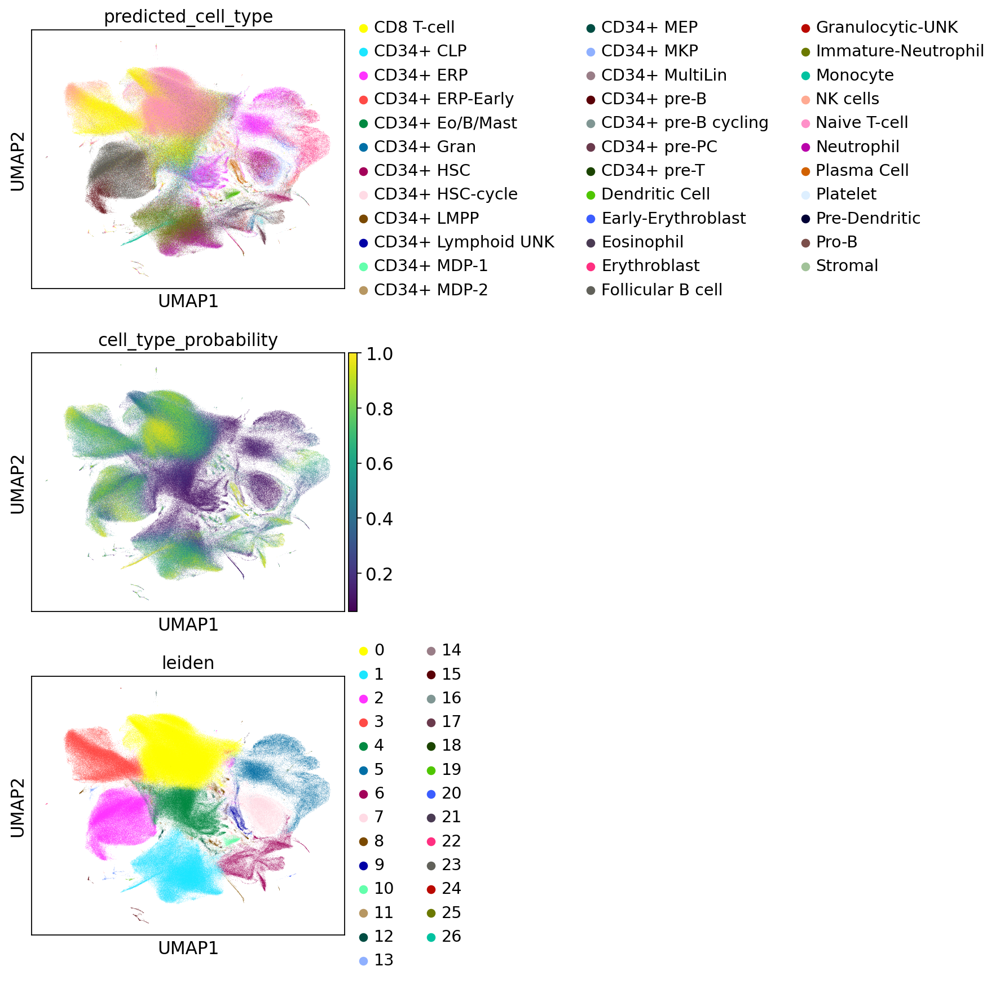

In [28]:
sc.pl.umap(adata, color=['predicted_cell_type', 'cell_type_probability', 'leiden'], ncols=1)

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


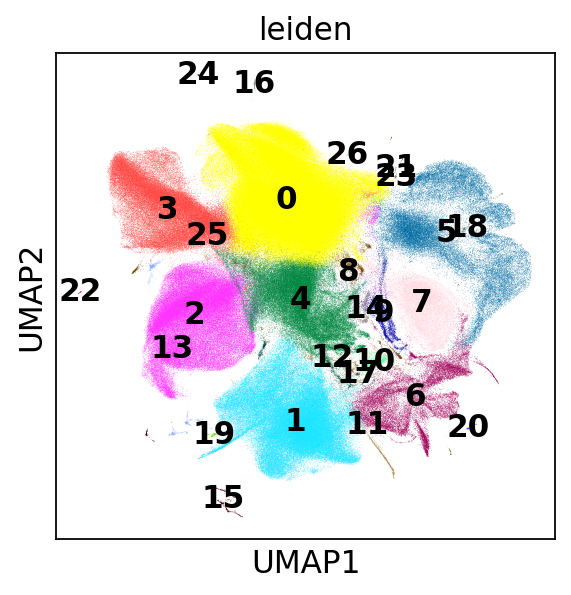

In [29]:
sc.pl.umap(adata, color=['leiden'], ncols=1, legend_loc='on data')

In [25]:
adata.write_h5ad('/home/estorrs/data/single_cell_classification/hca/census_of_immune_cells/processed.h5ad')

#### call cell types

In [49]:
markers = {
    'Pan-T': ['CD3G'],
    'CD8+': ['CD8A'],
    'CD4+': ['CD4'],
    'Naive': ['IL7R', 'CCR7', 'SELL', 'TCF7'],
    'Activated': ['CD69', 'CD28', 'CD44', 'DPP4'],
    'Proliferating': ['MKI67', 'TOP2A'],
    'Effector (CTL)': ['PRF1', 'GZMA', 'GZMB', 'GZMK', 'GNLY'],
    'Exausted': ['LAG3', 'HAVCR2', 'LAG3', 'EOMES', 'TIGIT'],
    #TCM CCR7+, SELL+, IL7Rhigh, CX3CR1+, IL2high
    #TEM CCR7-, SELL-, IL7Rhigh, CX3CR1+ , IL2low 
    'TCM/TEM': ['CCR7', 'SELL', 'CX3CR1', 'IL2'],
    'Treg': ['FOXP3'],
    'NK': ['GNLY', 'KLRD1', 'KLRB1', 'CD7'],
    'NK - Strong': ['FCGR3A', 'SPON2', 'KLRF1', 'PRF1', 'GZMB', 'GZMH', 'NKG7'],
    'NK - Weak': ['NCAM1', 'IL2RB'],
    'B': ['MS4A1'],
    'pre-B': ['IGLL1', 'VPREB1', 'CD24', 'STMN1', 'HIST1H1C', 'SOX4', 'MKI67'],
    'Plasma': ['SDC1', 'IGHG1', 'IGHG3', 'IGHG4', 'CD138', 'CD27', 'CD38'],
    'Granulocyte': ['FUT4'],
    'DC': ['ITGAX'],
    'pDC': ['IL3RA'],
    'PMN-MDSC': ['ITGAM', 'CD14', 'FUT4', 'CEACAM8', 'OLR1'],
    'M-MDSC': ['CD14', 'ITGAM', 'CD33', 'HLA-DRA', 'FUT4', 'CEACAM8', 'S100A9'],
    'Macrophage': ['CD68', 'AIF1', 'IFITM2', 'LST1', 'MS4A7'],
    'M1': ['CD86', 'NOS2', 'TNF', 'IL1B', 'CD38', 'CD40', 'SIGLEC1', 'FCGR3A', 'TLR2'],
    'M2': ['CD163', 'ARG1', 'IL10', 'IL4', 'SRSF10', 'MRC1', 'CD200R1', 'TGM2', 'TNFRSF6B', 'IL1R2', 'MSR1', 'TGM2'],
    'Erythrocyte': ['AHSP', 'ALAS2', 'CA1', 'GYPA'],
    'Monocyte': ['CD14', 'LYZ', 'S100A12', 'S100A8', 'S100A9'],
    'Non-classical Monocyte': ['FCGR3A'],
}

##### T cell

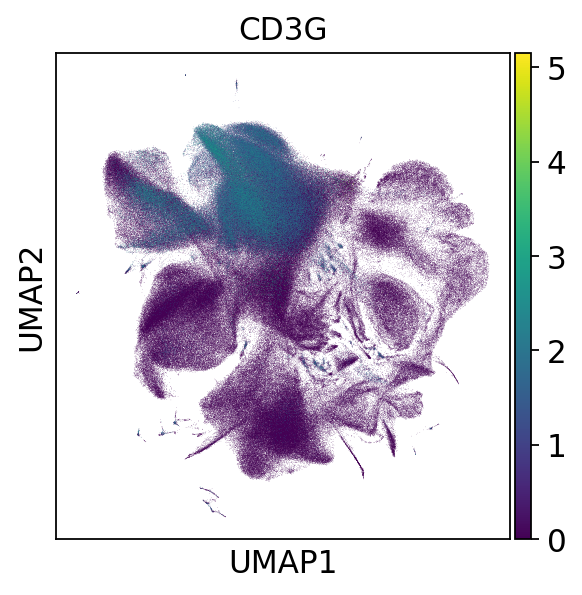

In [32]:
sc.pl.umap(adata, color=markers['Pan-T'], ncols=2)

In [35]:
course_clusters = {'3', '25', '0', '8'}
filtered = adata[[True if c in course_clusters else False for c in adata.obs['leiden_course']]].copy()
filtered

AnnData object with n_obs × n_vars = 385884 × 5000
    obs: 'analysis_protocol.protocol_core.protocol_id', 'analysis_protocol.provenance.document_id', 'analysis_working_group_approval_status', 'barcode', 'bundle_uuid', 'bundle_version', 'cell_suspension.genus_species.ontology', 'cell_suspension.genus_species.ontology_label', 'cell_suspension.provenance.document_id', 'derived_organ_label', 'derived_organ_ontology', 'derived_organ_parts_label', 'derived_organ_parts_ontology', 'donor_organism.development_stage.ontology', 'donor_organism.development_stage.ontology_label', 'donor_organism.diseases.ontology', 'donor_organism.diseases.ontology_label', 'donor_organism.human_specific.ethnicity.ontology', 'donor_organism.human_specific.ethnicity.ontology_label', 'donor_organism.is_living', 'donor_organism.provenance.document_id', 'donor_organism.sex', 'dss_bundle_fqid', 'emptydrops_is_cell', 'file_uuid', 'file_version', 'genes_detected', 'library_preparation_protocol.end_bias', 'library_preparat

Trying to set attribute `.uns` of view, copying.


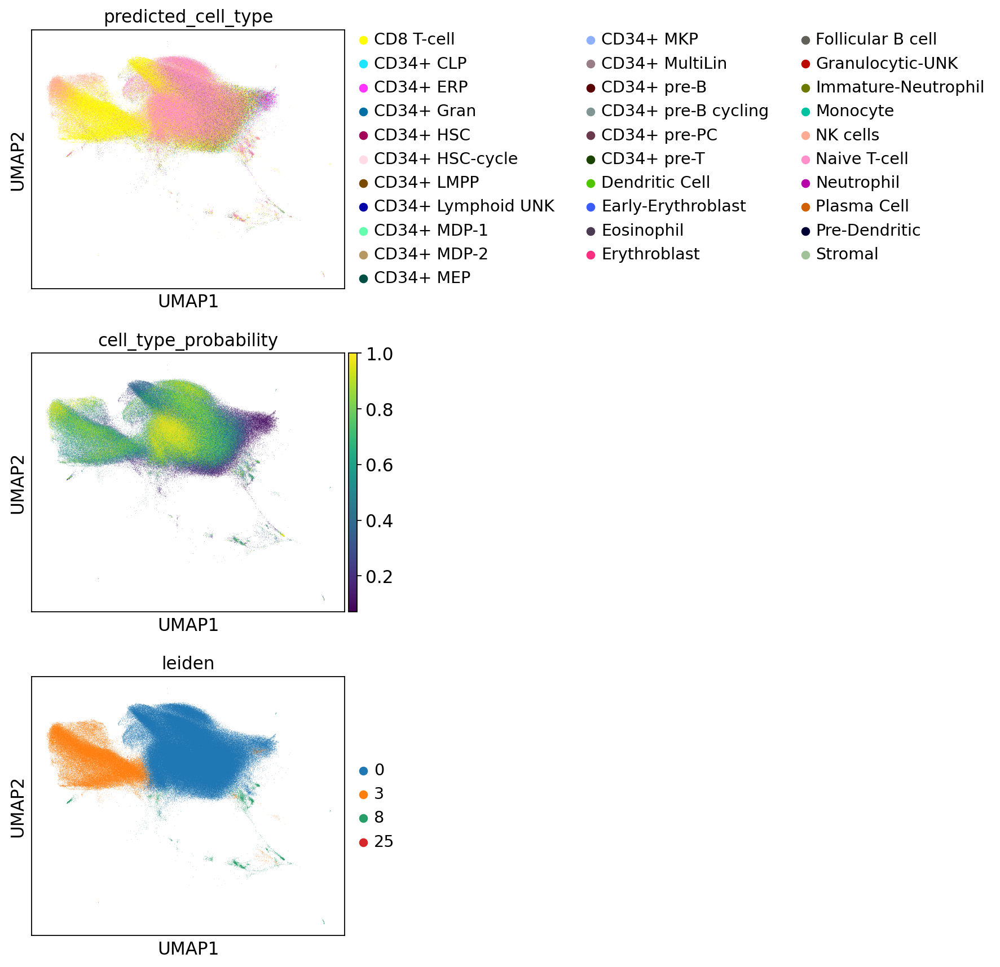

In [34]:
sc.pl.umap(filtered, color=['predicted_cell_type', 'cell_type_probability', 'leiden'], ncols=1)

In [36]:
## recluster
sc.tl.pca(filtered, svd_solver='arpack')
sc.pp.neighbors(filtered, n_neighbors=10, n_pcs=50)
sc.tl.umap(filtered)

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


In [37]:
sc.tl.leiden(adata, resolution=1.)
adata.obs['leiden_t_cell'] = adata.obs['leiden'].to_list()

In [38]:
adata.write_h5ad('/home/estorrs/data/single_cell_classification/hca/census_of_immune_cells/t_cell.h5ad')

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'leiden_t_cell' as categorical


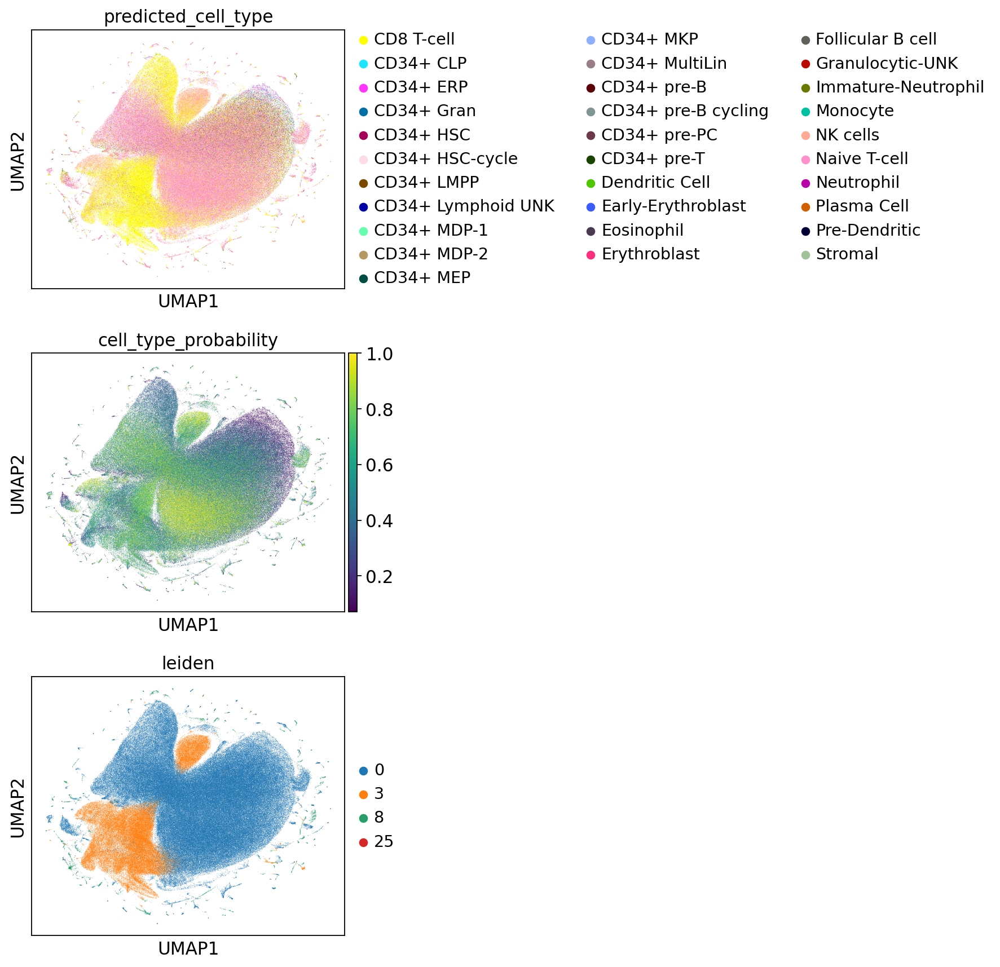

In [39]:
sc.pl.umap(filtered, color=['predicted_cell_type', 'cell_type_probability', 'leiden'], ncols=1)

In [ ]:
name_to_cluster = {}

pan t

In [ ]:
sc.pl.umap(filtered, color=markers['Pan-T'], ncols=2)

In [ ]:
CD4

cd 8

In [ ]:
sc.pl.umap(filtered, color=markers['CD8+'], ncols=2)

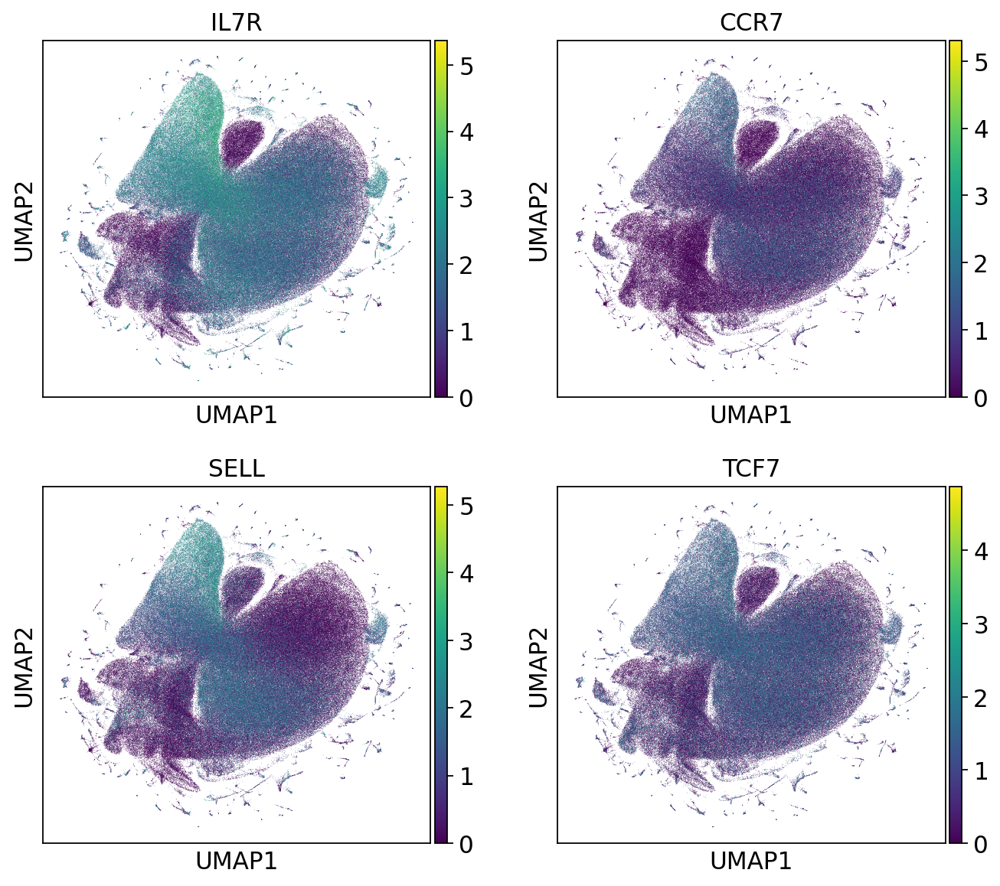

In [40]:
sc.pl.umap(filtered, color=markers['Naive'], ncols=2)

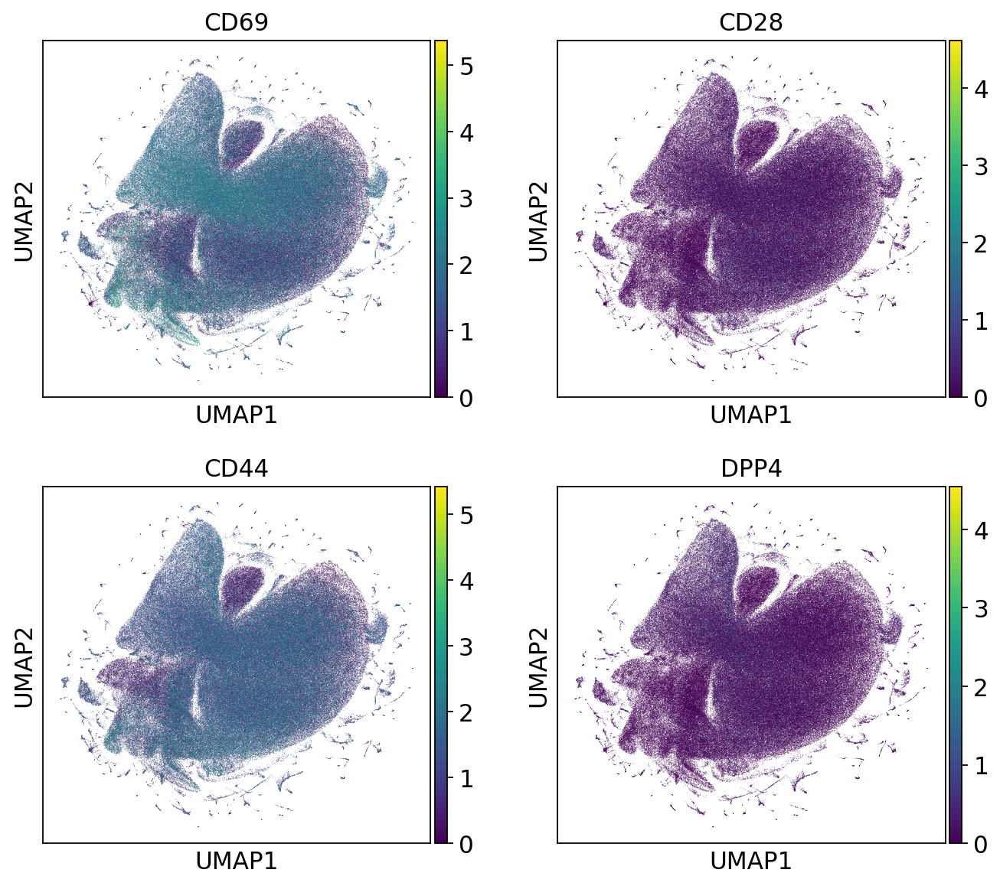

In [41]:
sc.pl.umap(filtered, color=markers['Activated'], ncols=2)

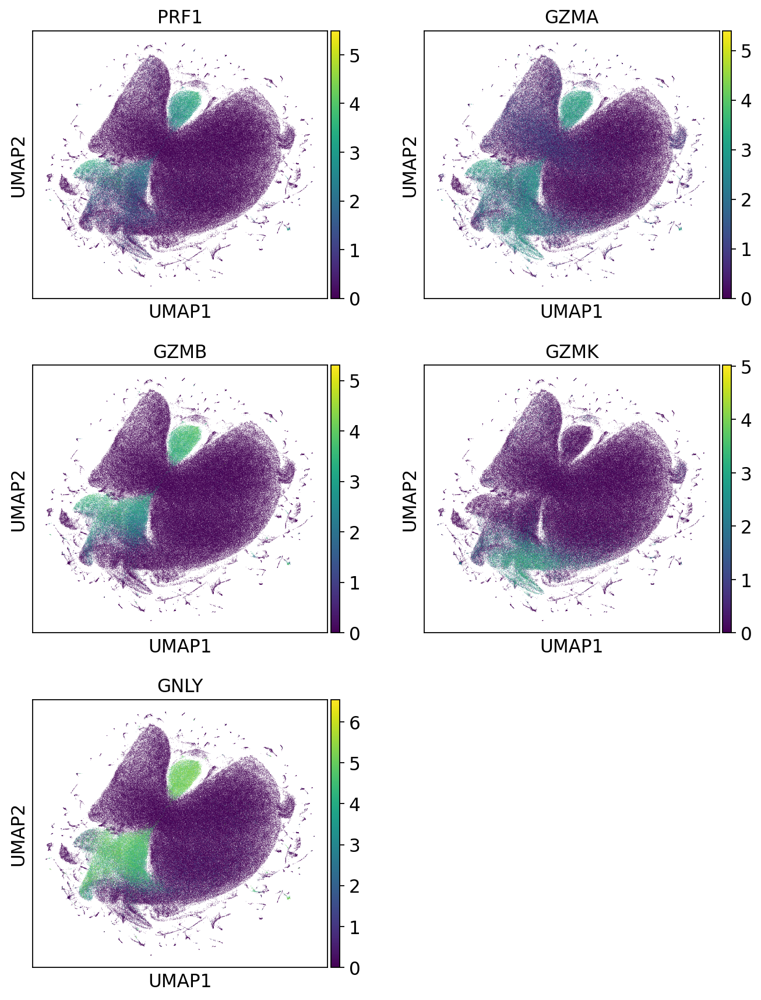

In [42]:
sc.pl.umap(filtered, color=markers['Effector (CTL)'], ncols=2)

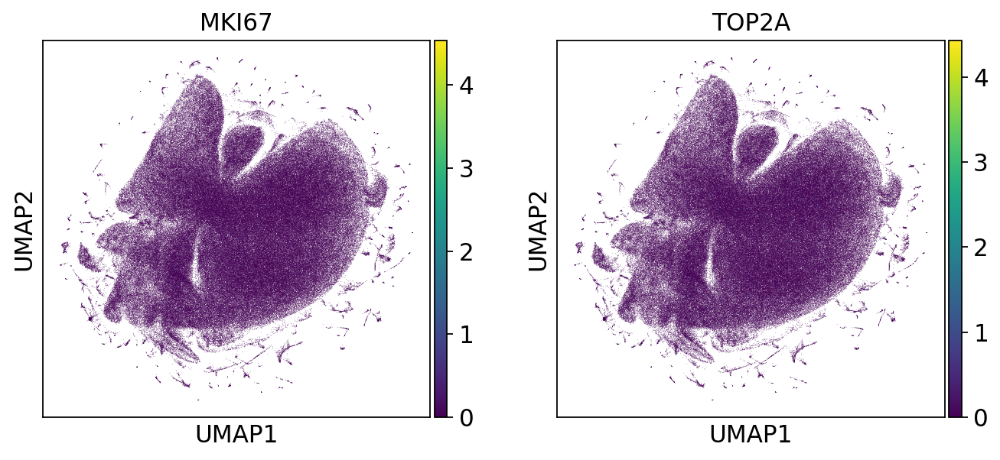

In [43]:
sc.pl.umap(filtered, color=markers['Proliferating'], ncols=2)

In [44]:
n = sc.read_h5ad('../benchmarking/data/11302020_harmonized/teir_2/scRNAseq/brca.h5ad')
n

AnnData object with n_obs × n_vars = 98564 × 27131
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'sample', 'tissue_type', 'cell_type', 'cell_type_specific', 'Piece_ID', 'Clinical_Subtype', 'Bulk_PAM50', 'doublet_score', 'predicted_doublet', 'ident'
    var: 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_mean', 'sct.residual_variance', 'sct.variable'
    obsm: 'X_pca', 'X_umap'
    layers: 'logcounts'

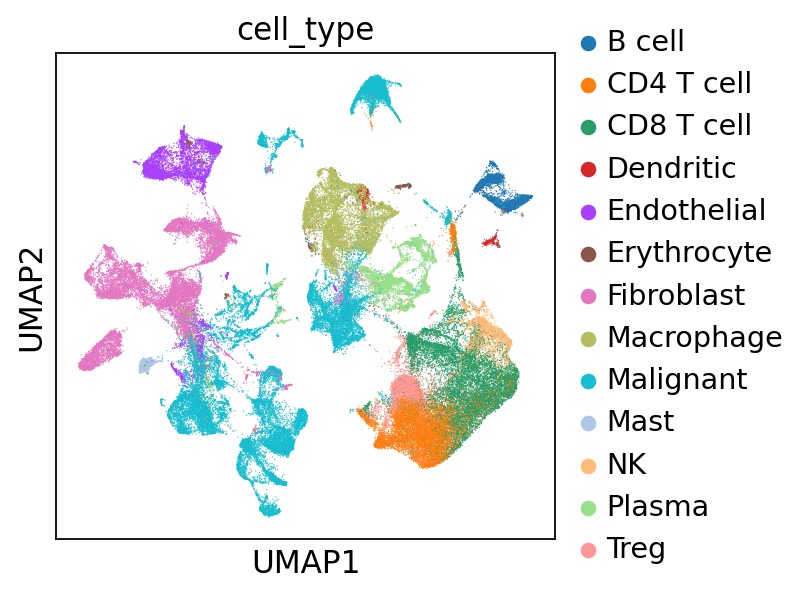

In [45]:
sc.pl.umap(n, color=['cell_type'])

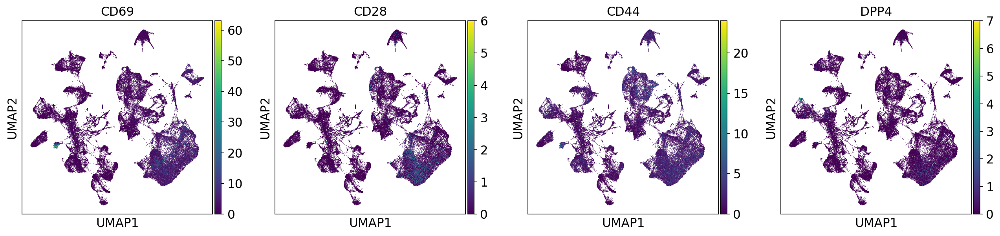

In [46]:
sc.pl.umap(n, color=markers['Activated'])

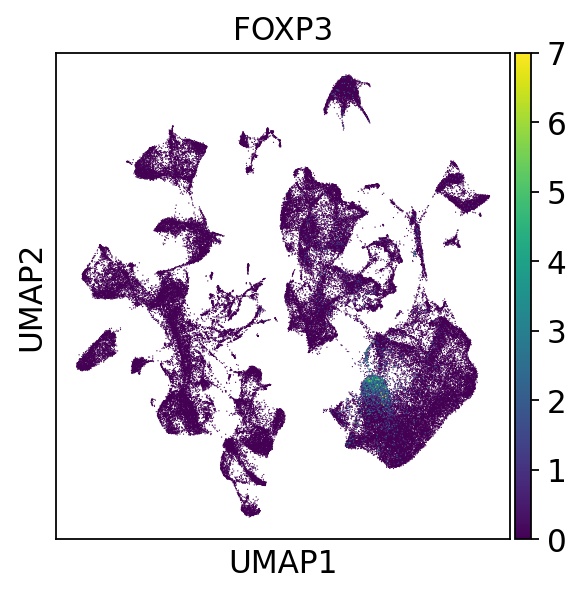

In [52]:
sc.pl.umap(n, color=markers['Treg'])

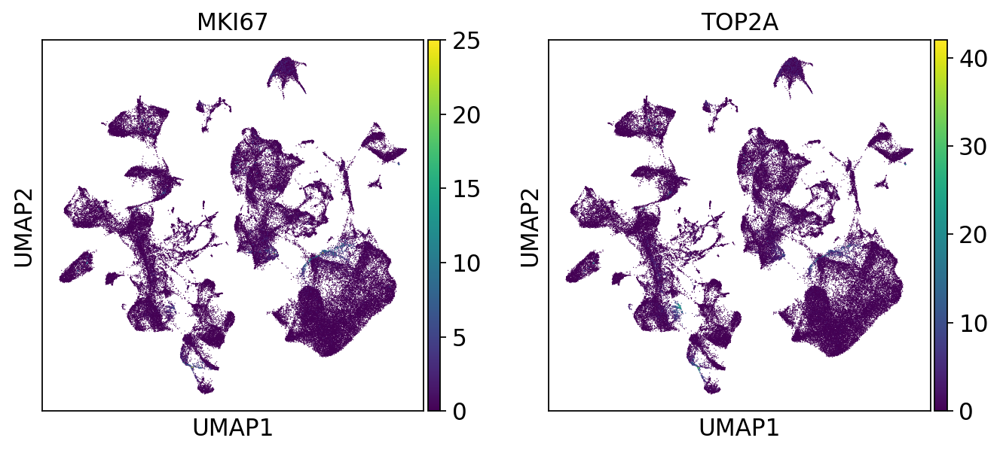

In [54]:
sc.pl.umap(n, color=markers['Proliferating'])

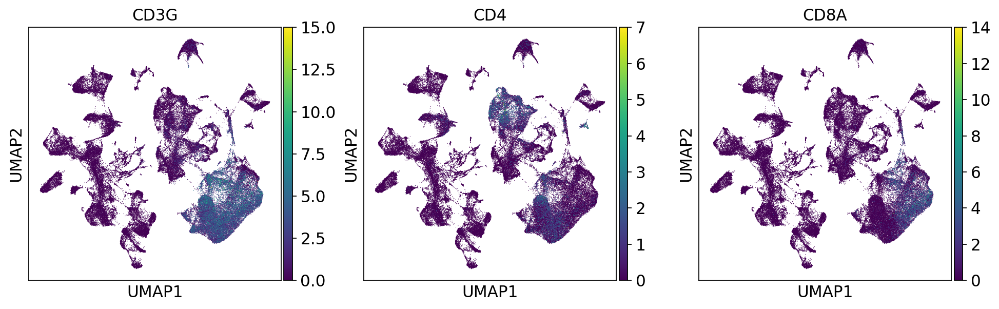

In [55]:
sc.pl.umap(n, color=['CD3G', 'CD4', 'CD8A'])

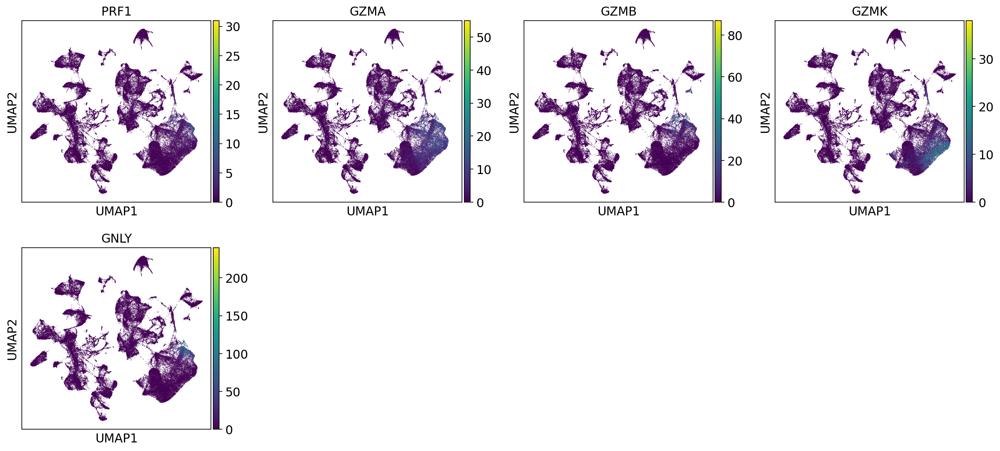

In [53]:
sc.pl.umap(n, color=markers['Effector (CTL)'])

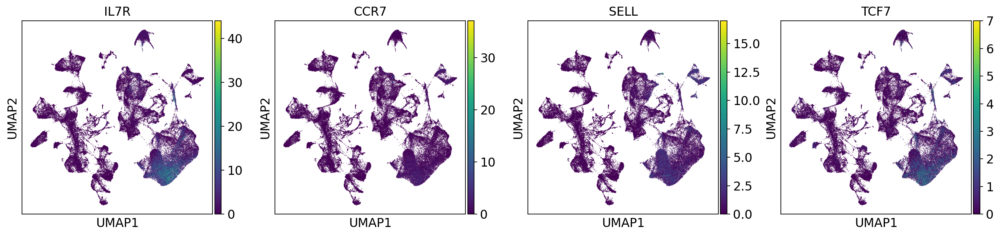

In [51]:
sc.pl.umap(n, color=markers['Naive'])

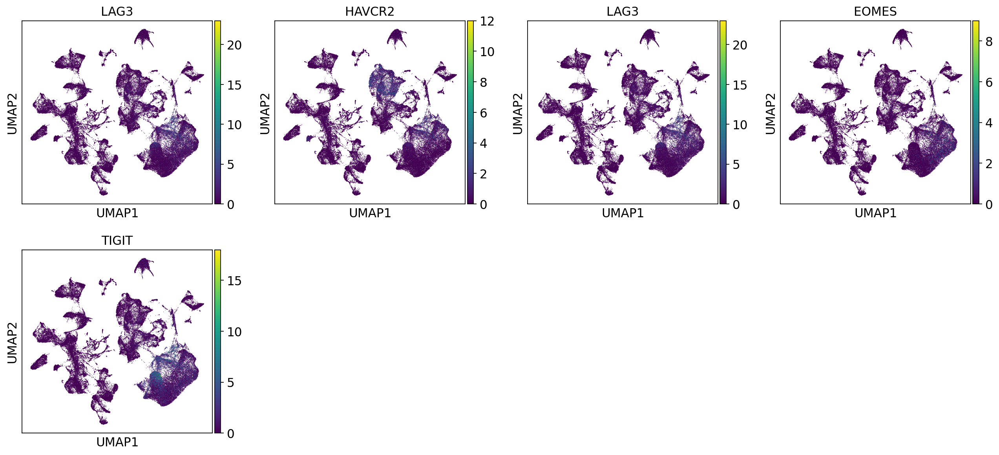

In [50]:
sc.pl.umap(n, color=markers['Exausted'])

##### Monocyte/Macrophage

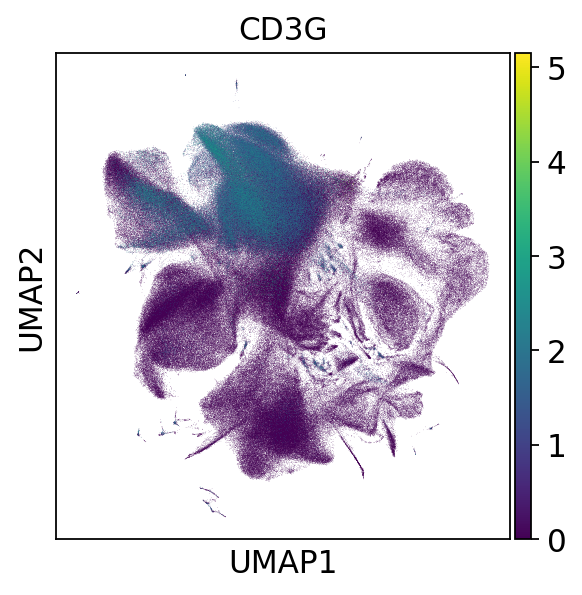

In [32]:
# sc.pl.umap(adata, color=markers['Pan-T'], ncols=2)

In [35]:
course_clusters = {'1'}
filtered = adata[[True if c in course_clusters else False for c in adata.obs['leiden_course']]].copy()
filtered

AnnData object with n_obs × n_vars = 385884 × 5000
    obs: 'analysis_protocol.protocol_core.protocol_id', 'analysis_protocol.provenance.document_id', 'analysis_working_group_approval_status', 'barcode', 'bundle_uuid', 'bundle_version', 'cell_suspension.genus_species.ontology', 'cell_suspension.genus_species.ontology_label', 'cell_suspension.provenance.document_id', 'derived_organ_label', 'derived_organ_ontology', 'derived_organ_parts_label', 'derived_organ_parts_ontology', 'donor_organism.development_stage.ontology', 'donor_organism.development_stage.ontology_label', 'donor_organism.diseases.ontology', 'donor_organism.diseases.ontology_label', 'donor_organism.human_specific.ethnicity.ontology', 'donor_organism.human_specific.ethnicity.ontology_label', 'donor_organism.is_living', 'donor_organism.provenance.document_id', 'donor_organism.sex', 'dss_bundle_fqid', 'emptydrops_is_cell', 'file_uuid', 'file_version', 'genes_detected', 'library_preparation_protocol.end_bias', 'library_preparat

Trying to set attribute `.uns` of view, copying.


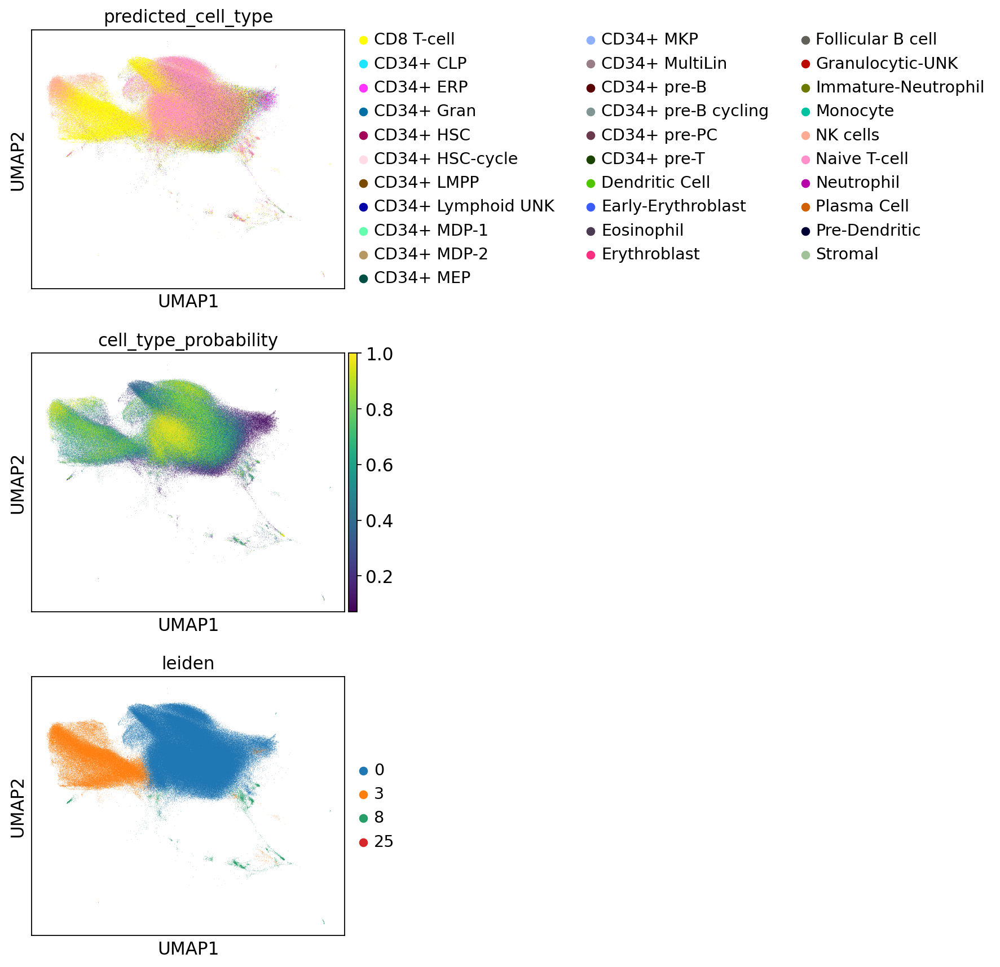

In [34]:
sc.pl.umap(filtered, color=['predicted_cell_type', 'cell_type_probability', 'leiden'], ncols=1)

In [ ]:
## recluster
sc.tl.pca(filtered, svd_solver='arpack')
sc.pp.neighbors(filtered, n_neighbors=10, n_pcs=50)
sc.tl.umap(filtered)

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


In [ ]:
sc.tl.leiden(adata, resolution=1.)
adata.obs['leiden_t_cell'] = adata.obs['leiden'].to_list()

In [ ]:
adata.write_h5ad('/home/estorrs/data/single_cell_classification/hca/census_of_immune_cells/t_cell.h5ad')

##### progenitor